In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import openslide
import pandas as pd

In [4]:
from fastai.callbacks.csv_logger import CSVLogger

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

In [6]:
slides_train = list(set([ "14_EIPH_568381 Turnbull blue.svs", 
                           "26_EIPH_566482 L Berliner Blau.svs",
                              "01_EIPH_563479 Berliner Blau.svs", 
                              "02_EIPH_574162 berliner blau.svs",
                               "28_EIPH_569948 L Turnbull blue.svs", 
                        ]))


slides_val = list(set(['BAL_Cat_Turnbull blue_12.svs',
                              'BAL_Cat_Turnbull blue_13.svs', 
                              'BAL_Cat_Turnbull blue_14.svs']))

In [7]:
annotations_path = Path("../../Statistics/EIPH_Annotations.pkl")
annotations = pd.read_pickle(annotations_path)
annotations_train = annotations[annotations["image_name"].isin(slides_train)]
annotations_val = annotations[annotations["image_name"].isin(slides_val)]
annotations_train.head()

,id,image_id,image_set,species,image_name,image_type,grade,vector,unique_identifier,user_id,deleted,last_editor,data_set_name,version
105389,1417177,3526,245,equine,14_EIPH_568381 Turnbull blue.svs,TurnbullBlue,0,"{'x1': 17958, 'x2': 18042, 'y1': 4266, 'y2': 4...",b37370a6-d4c9-48e1-ad11-1ce32c895513,1,False,1,SREP,SREP_V2
105390,1417178,3526,245,equine,14_EIPH_568381 Turnbull blue.svs,TurnbullBlue,0,"{'x1': 17999, 'x2': 18113, 'y1': 4245, 'y2': 4...",01c4de6f-2641-4696-a971-cb62b0dca32e,1,False,1,SREP,SREP_V2
105391,1417188,3526,245,equine,14_EIPH_568381 Turnbull blue.svs,TurnbullBlue,0,"{'x1': 17715, 'x2': 17803, 'y1': 4550, 'y2': 4...",14d331ee-a150-48e2-a405-fea2dc4caca8,1,True,1,SREP,SREP
105392,1417189,3526,245,equine,14_EIPH_568381 Turnbull blue.svs,TurnbullBlue,0,"{'x1': 17780, 'x2': 17886, 'y1': 4793, 'y2': 4...",9049128f-0afe-4d66-8659-ef74a1dd911f,1,True,1,SREP,SREP
105393,1417197,3526,245,equine,14_EIPH_568381 Turnbull blue.svs,TurnbullBlue,0,"{'x1': 18905, 'x2': 19011, 'y1': 4702, 'y2': 4...",02747511-c950-40d9-b72a-d84ce8ede147,1,False,1,SREP,SREP_V2


In [8]:
slides_path = Path("../../../Slides")
files = {slide.name: slide for slide in slides_path.rglob("*.svs")  if slide.name in slides_train + slides_val}
files

{'01_EIPH_563479 Berliner Blau.svs': PosixPath('../../../Slides/Equine/01_EIPH_563479 Berliner Blau.svs'),
 '02_EIPH_574162 berliner blau.svs': PosixPath('../../../Slides/Equine/02_EIPH_574162 berliner blau.svs'),
 '14_EIPH_568381 Turnbull blue.svs': PosixPath('../../../Slides/Equine/14_EIPH_568381 Turnbull blue.svs'),
 '26_EIPH_566482 L Berliner Blau.svs': PosixPath('../../../Slides/Equine/26_EIPH_566482 L Berliner Blau.svs'),
 '28_EIPH_569948 L Turnbull blue.svs': PosixPath('../../../Slides/Equine/28_EIPH_569948 L Turnbull blue.svs'),
 'BAL_Cat_Turnbull blue_12.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_12.svs'),
 'BAL_Cat_Turnbull blue_13.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_13.svs'),
 'BAL_Cat_Turnbull blue_14.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_14.svs')}

In [9]:
size = 1024 
level = 0
bs = 16
train_images = 2500
val_images = 1500
experiment_name = "EquineVsCat"

In [10]:
train_files = []
val_files = []

for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
train_files = list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(val_files, val_images))

In [11]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=90,
                      max_lighting=0.0,
                      max_zoom=1.,
                      max_warp=0.0,
                      p_affine=0.5,
                      p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )
tfms

([RandTransform(tfm=TfmCrop (crop_pad), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1), 'padding_mode': 'reflection'}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (dihedral_affine), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (rotate), kwargs={'degrees': (-10.0, 10.0)}, p=0.5, resolved={}, do_run=True, is_random=True)],
 [RandTransform(tfm=TfmCrop (crop_pad), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True)])

In [12]:
def get_y_func(x):
    return x.y

In [13]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate).normalize()

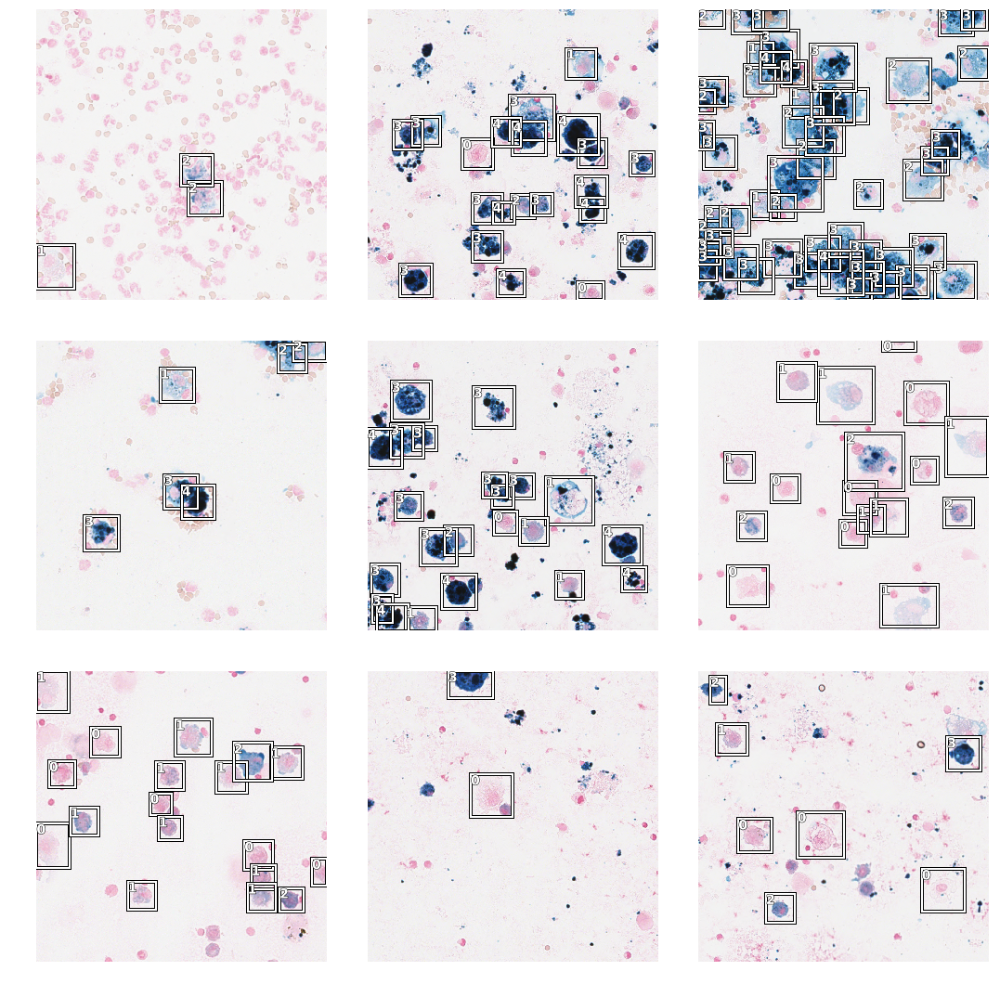

In [14]:
data.show_batch(rows=3, ds_type=DatasetType.Train, figsize=(15,15))

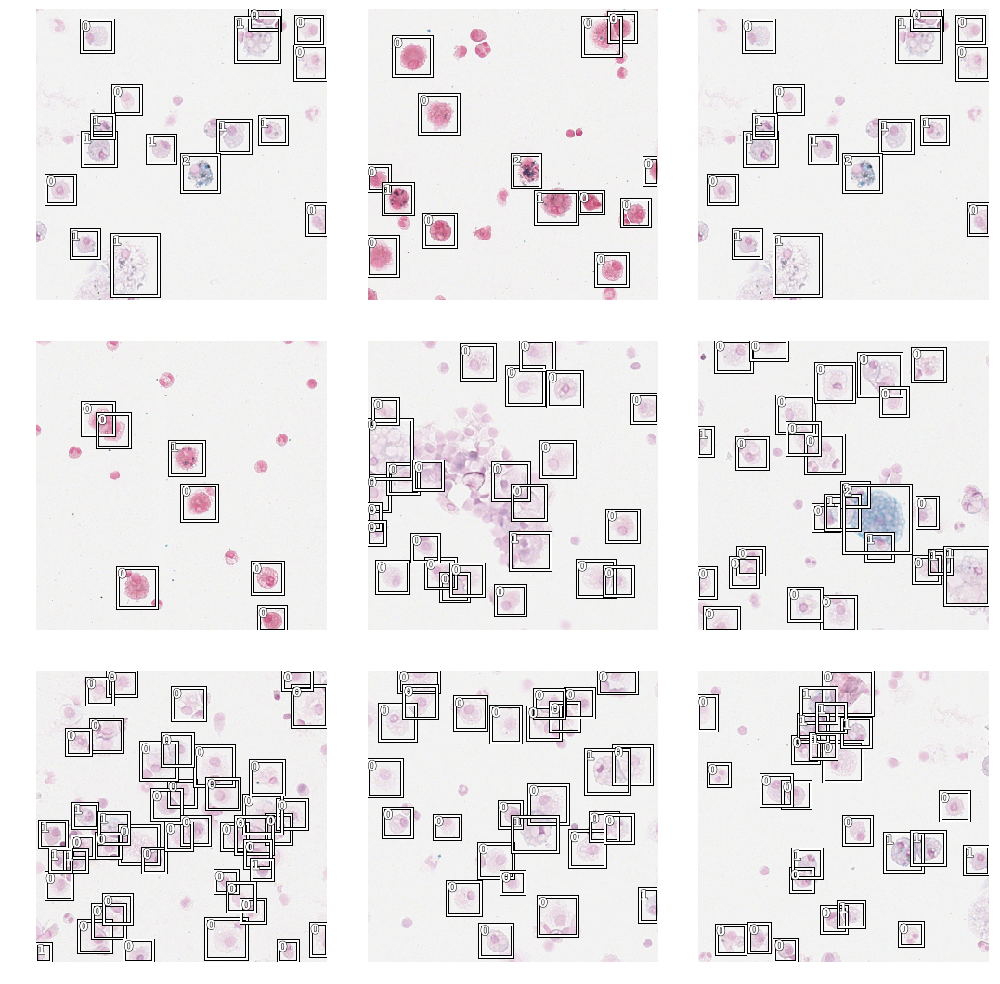

In [15]:
data.show_batch(rows=3, ds_type=DatasetType.Valid, figsize=(15,15))

In [16]:
anchors = create_anchors(sizes=[(32,32)], ratios=[1], scales=[0.6, 0.7, 0.9, 1.25, 1.5])

In [17]:
crit = RetinaNetFocalLoss(anchors)
encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=5, sizes=[32], chs=128, final_bias=-4., n_conv=3)

In [18]:
voc = PascalVOCMetricByDistance(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]], radius=40)
learn = Learner(data, model, loss_func=crit, callback_fns=[BBMetrics, partial(CSVLogger, append=True, filename=experiment_name)], #BBMetrics, ShowGraph
                metrics=[voc]
               )

In [19]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

In [20]:
learn.fit_one_cycle(3, 1e-3)

/home/c.marzahl@de.eu.local/virtualenv/tf/lib/python3.6/site-packages/object_detection_fastai/helper/Evaluator.py:171: RuntimeWarning: invalid value encountered in true_divide
  rec = acc_TP / npos


In [21]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-3)

/home/c.marzahl@de.eu.local/virtualenv/tf/lib/python3.6/site-packages/object_detection_fastai/helper/Evaluator.py:171: RuntimeWarning: invalid value encountered in true_divide
  rec = acc_TP / npos


In [22]:
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-0,AP-1,AP-2,AP-3,AP-4,time
0,0.212235,0.249272,nan,0.051948,0.197324,0.705717,0.480866,0.561219,0.000000,nan,05:13
1,0.256540,0.258378,nan,0.056603,0.201776,0.762816,0.273016,0.349515,1.000000,nan,05:52
2,0.278260,0.301095,nan,0.074239,0.226856,0.701777,0.514654,0.206731,0.000000,nan,05:23
3,0.286543,0.236100,nan,0.056459,0.179640,0.810798,0.353129,0.134112,0.000000,nan,05:45
4,0.264326,0.270460,nan,0.052830,0.217630,0.786403,0.232934,0.000000,0.000000,nan,05:41
5,0.251466,0.308446,nan,0.048887,0.259559,0.391295,0.481012,0.351106,0.000000,nan,04:47
6,0.227290,0.268627,nan,0.060005,0.208622,0.791143,0.489519,0.272268,0.010101,nan,05:25
7,0.206847,0.285161,nan,0.051821,0.233340,0.508866,0.515689,0.397590,1.000000,nan,04:54
8,0.186943,0.239890,nan,0.047660,0.192230,0.690037,0.546209,0.000000,1.000000,nan,05:17
9,0.185410,0.250486,nan,0.048266,0.202220,0.711171,0.552486,0.000000,1.000000,nan,05:15


/home/c.marzahl@de.eu.local/virtualenv/tf/lib/python3.6/site-packages/object_detection_fastai/helper/Evaluator.py:171: RuntimeWarning: invalid value encountered in true_divide
  rec = acc_TP / npos


In [23]:
import pickle

stats = {"anchors": anchors,
         "mean": to_np(data.stats[0]),
         "std": to_np(data.stats[1]),
         "size": size,
         "n_classes": 6,
         "n_anchors": 5,
         "sizes": [32],
         "chs": 128,
         "encoder": "RN-18",
         "n_conv": 3,
         "level": 0,
         "model": get_model(learn.model).state_dict()
        }

torch.save(stats, "{}.p".format(experiment_name))

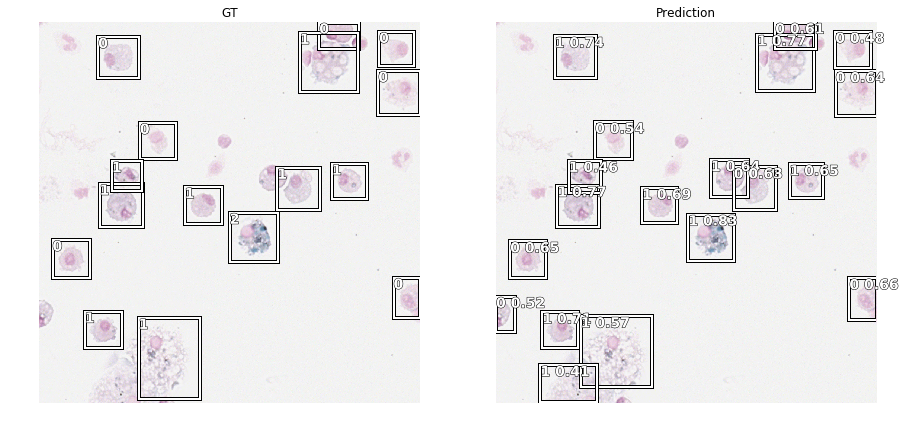

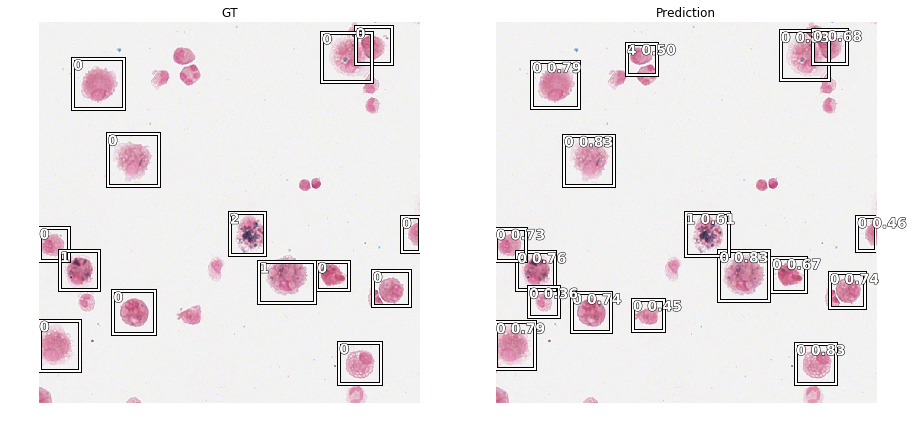

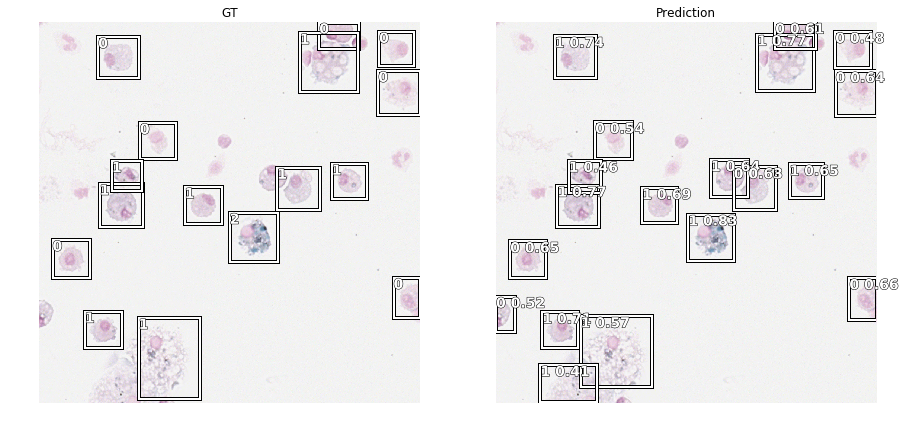

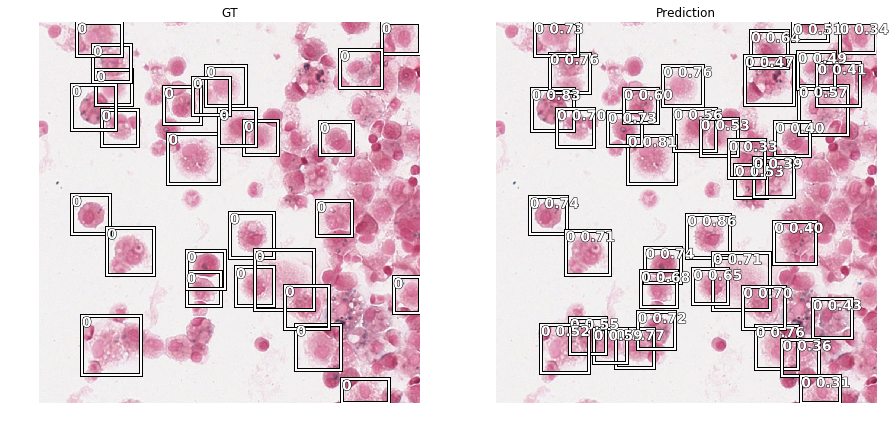

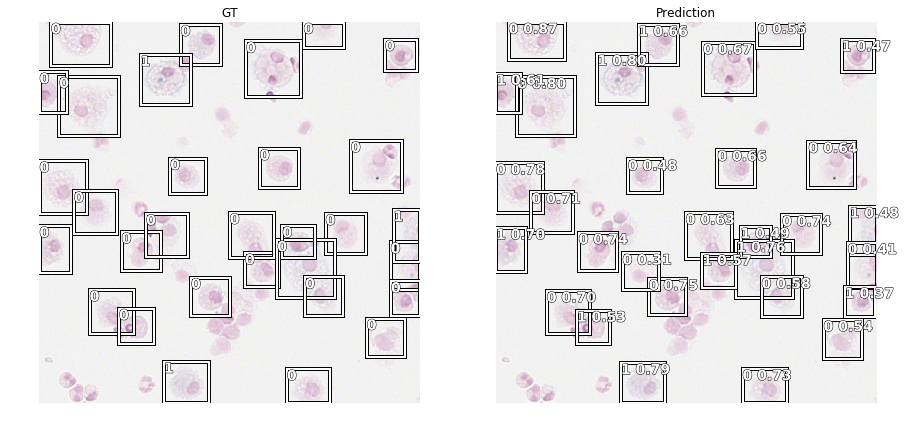

...

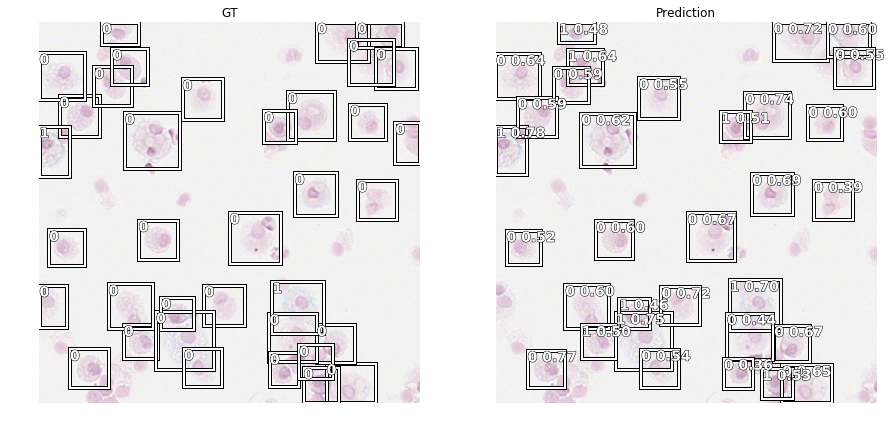

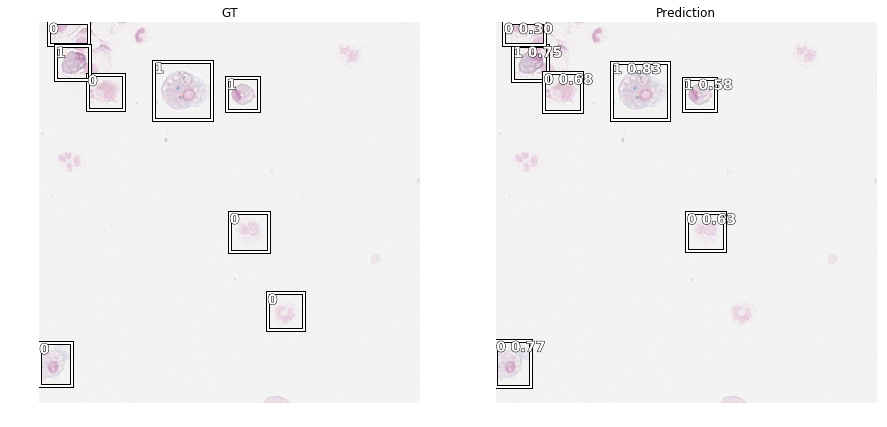

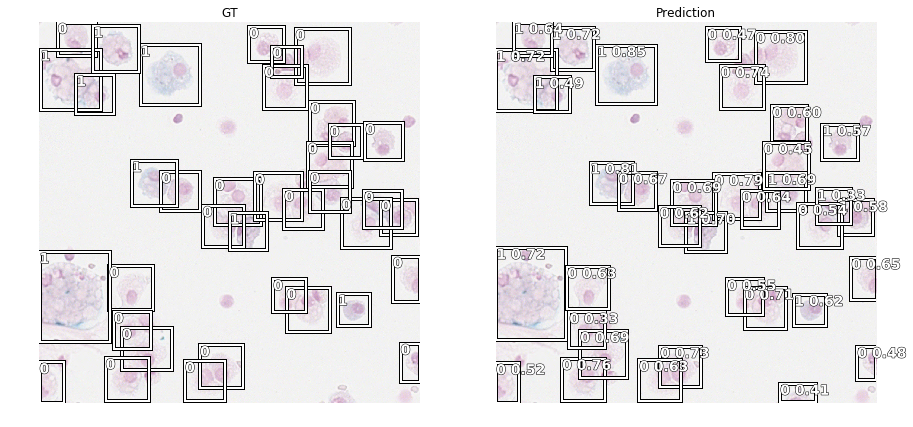

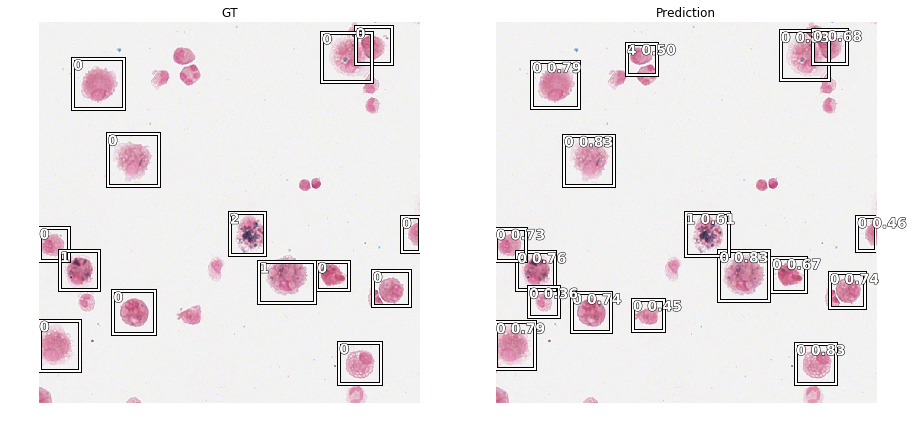

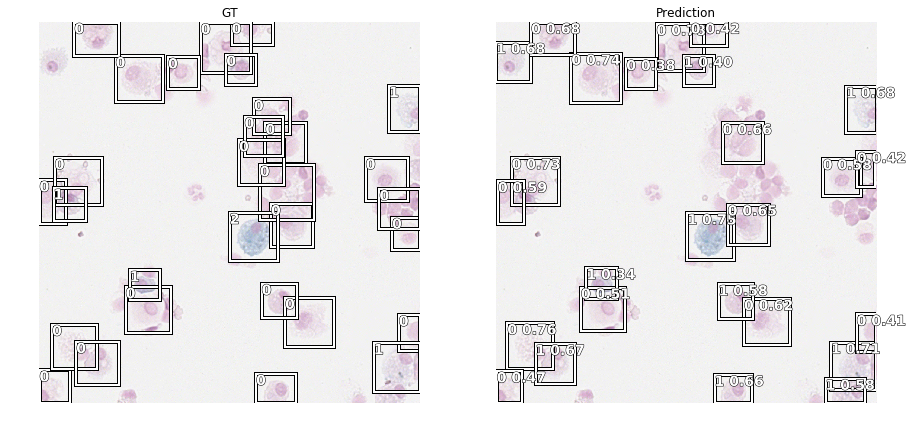

In [24]:
slide_object_result(learn, anchors, detect_thresh=0.3, nms_thresh=0.2, image_count=20)